In [182]:
import numpy as np
from scipy.stats import pareto
import matplotlib.pyplot as plt
from kNN_CDFs import CDFkNN
from SEdist import SE_distribution
from scipy.interpolate import interp1d
from scipy.special import gamma, gammaln

import numpy as np
from scipy.special import gamma, gammaln
def Erlang(k, lam, x):
    if k == 0:
        klamx = lam * x
        gammak = 1
        return (klamx) ** k / gammak * np.exp(-klamx)
    else:
        klamx = k * lam * x
        gammak = gamma(k)
#    return (klamx) ** k / gammak * np.exp(-klamx)
    return np.exp(k*np.log(klamx) -klamx -gammaln(k))

def wrap_large_values(p, box_r):
    keep_going = True
    while keep_going:
        ind = np.where(p > box_r)[0]
#        print(len(ind),ind)
        if len(ind)>1:
            p[ind] -= box_r
        else:
            keep_going=False
    return p

def levi_flight_2d(N,b,box=0):
    r = pareto.rvs(b, size=N)
    a = np.random.uniform(-np.pi,np.pi,N)
    x = np.cos(a)*r
    y = np.sin(a)*r

    p = [x.cumsum(), y.cumsum()]

    if box>1e-4:
        pm = np.min(p,axis=1)
        for i in range(len(p)):
            p[i] -= pm[i]
        p[0] = wrap_large_values(p[0][:],box)/box
        p[1] = wrap_large_values(p[1][:],box)/box

    return np.array(p).T

def levi_flight_3d(N,b,box=0):
    r = pareto.rvs(b, size=N)
    phi = np.random.uniform(0,np.pi,N)
    t = np.random.uniform(0,2*np.pi,N)
    x = np.cos(t)*np.sin(phi)*r
    y = np.sin(t)*np.sin(phi)*r
    z = np.cos(phi)*r

    p = [x.cumsum(), y.cumsum(), z.cumsum()]

    if box>1e-4:
        pm = np.min(p,axis=1)
        for i in range(len(p)):
            p[i] -= pm[i]
        p[0] = wrap_large_values(p[0][:],box)/box
        p[1] = wrap_large_values(p[1][:],box)/box
        p[2] = wrap_large_values(p[2][:],box)/box

    return np.array(p).T

<H1>Levy flights</H1>
<a url="https://en.wikipedia.org/wiki/Lévy_flight">Levy flights</a> are a well studied type of random walk and have find applications in a very broad range of fields. 
One chooses random angles to move at each step and chooses the step length from a <a url="https://en.wikipedia.org/wiki/Pareto_distribution">Pareto distribution</a>. 

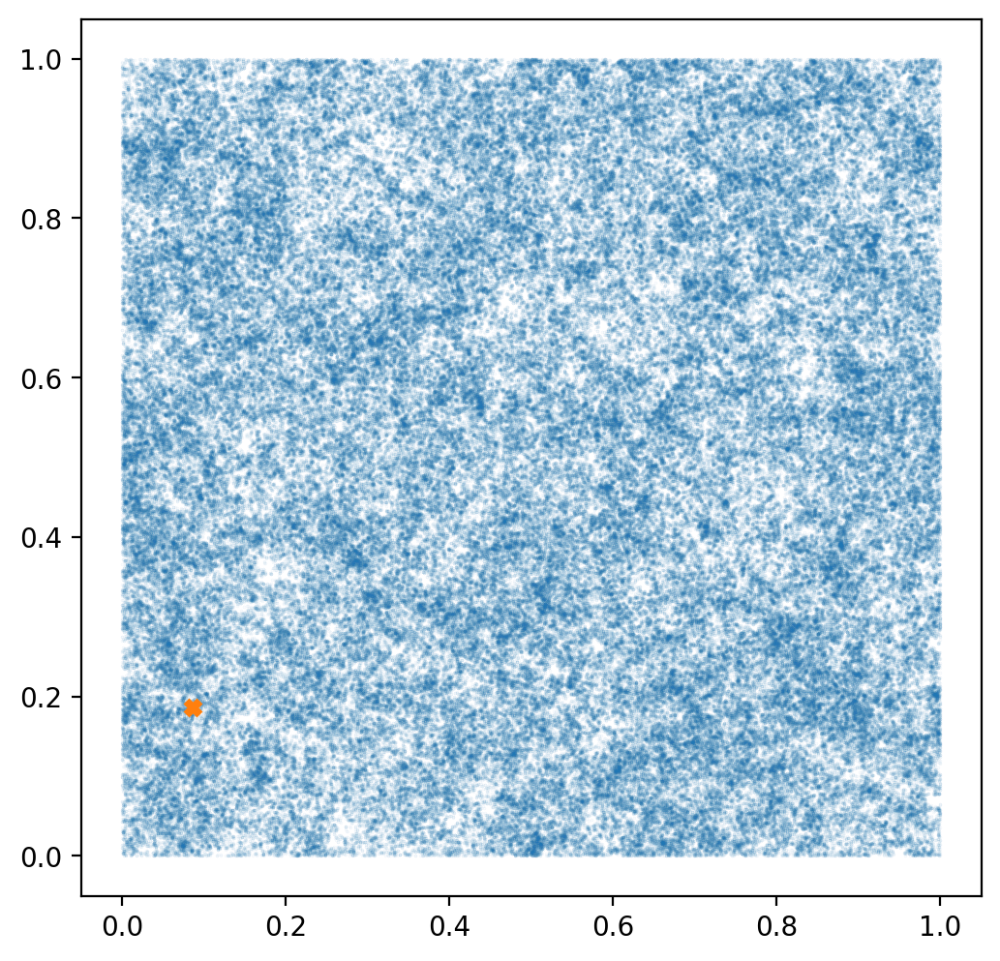

In [183]:
b = 1.2
N = 1000000
fig = plt.figure(figsize=(6,6),dpi=200)
p = levi_flight_3d(N, b, box=1000)
plt.plot(p[:,0],p[:,1],'.',ms=0.3, alpha=0.1)
plt.plot(p[0,0],p[0,1],'X');

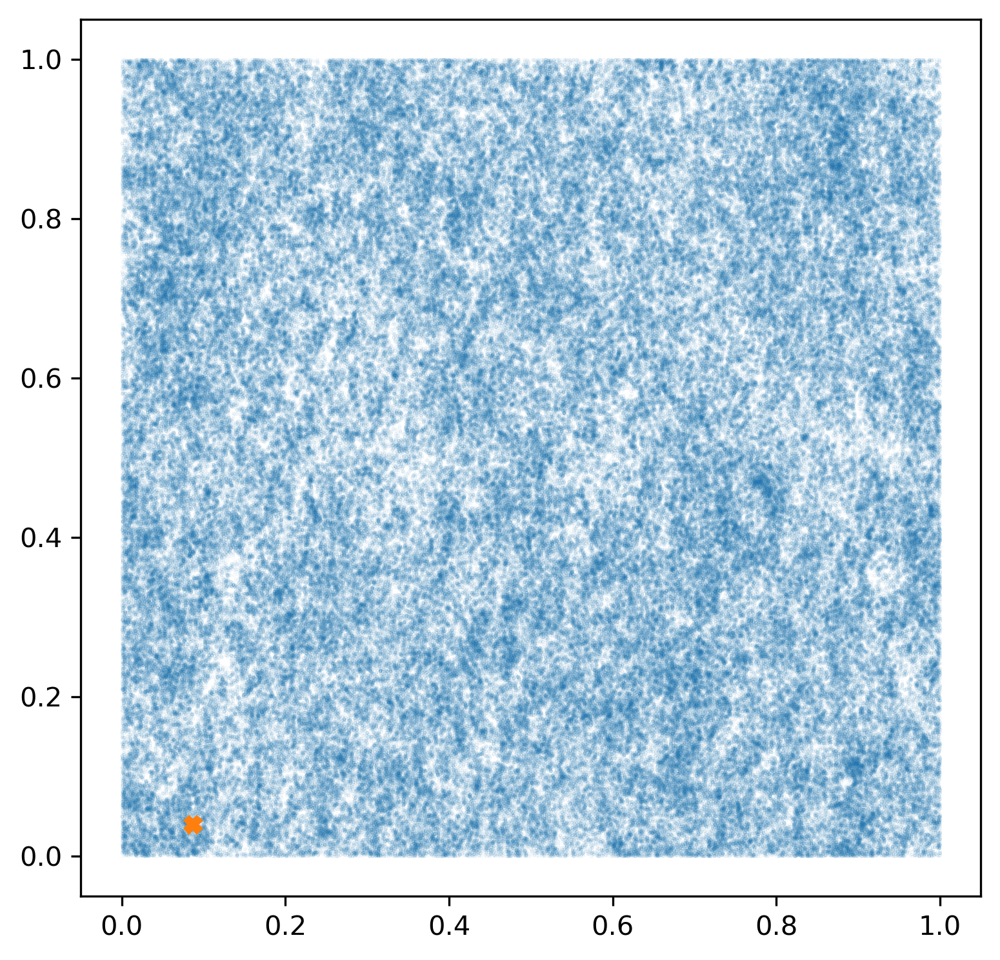

In [206]:
fig = plt.figure(figsize=(6,6),dpi=300)
plt.plot(p[:,0],p[:,2],'.',ms=0.3, alpha=0.1)
plt.plot(p[0,0],p[0,2],'X');

In [185]:
# make a uniform grid to measure on
boxsize = 1.
dim = 3  # three dimensions
Nplg = 100 # 
xpoi = boxsize * (np.arange(0, Nplg) + 0.5) / Nplg
xoutg = np.array(np.meshgrid(xpoi, xpoi, xpoi, indexing="xy"))
xoutg = xoutg.T.reshape(Nplg ** 3, 3)

In [186]:
kneighbors = np.arange(550)+1 # get first __ nearest neighbors (starts at k=1)
CDFs  = CDFkNN(p, xoutg, kneighbors=kneighbors, periodic=1.,compress="log",Ninterpolants=500)
Pks = { k-1: interp1d(CDFs[k].f.x,CDFs[k-1].cdf(CDFs[k].f.x)-CDFs[k].cdf(CDFs[k].f.x), bounds_error=False,fill_value=(0,0))  for k in kneighbors[1:]}
Pks.update({ 0: interp1d(CDFs[1].f.x,1-CDFs[1].cdf(CDFs[1].f.x), bounds_error=False,fill_value=(0,0)) })
Vbar = boxsize**dim/N
vols = np.array([0.01,0.03,0.1,0.3,1,3,10,30,100])*Vbar
CICs = np.zeros((len(vols),len(kneighbors)))
for i, vol in enumerate(vols):
    CICs[i][:] = [Pks[k](vol) for k in kneighbors-1]

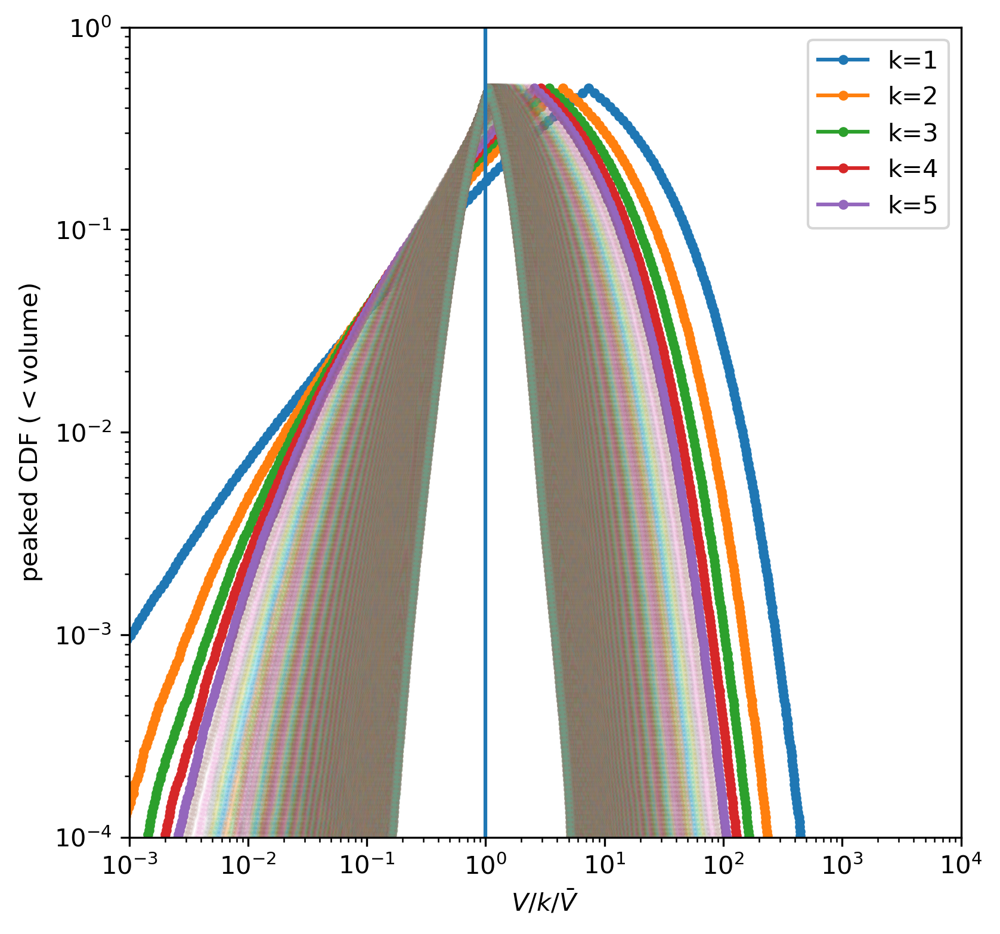

In [187]:
fig = plt.figure(figsize=(6,6),dpi=300)

for k in kneighbors:
    vol = CDFs[k].f.x
    lab = ""
    af = 0.1
    if (k < 6) :
        lab = "k="+str(k)
        af = 1

    plt.semilogy(vol/k/Vbar, CDFs[k].pcdf(vol),'.-',alpha=af, label=lab)
    plt.axvline(CDFs[k].mean()/k)
    
plt.axvline(1)
plt.xscale("log")
plt.xlim([1e-3,1e4])
plt.ylim([1e-4,1])
plt.ylabel("peaked CDF ($<$volume)")
plt.legend()
plt.xlabel(r"$V/k/\bar{V}$");

*The peaked CDF for all the measured nearest neighbor distributions.*

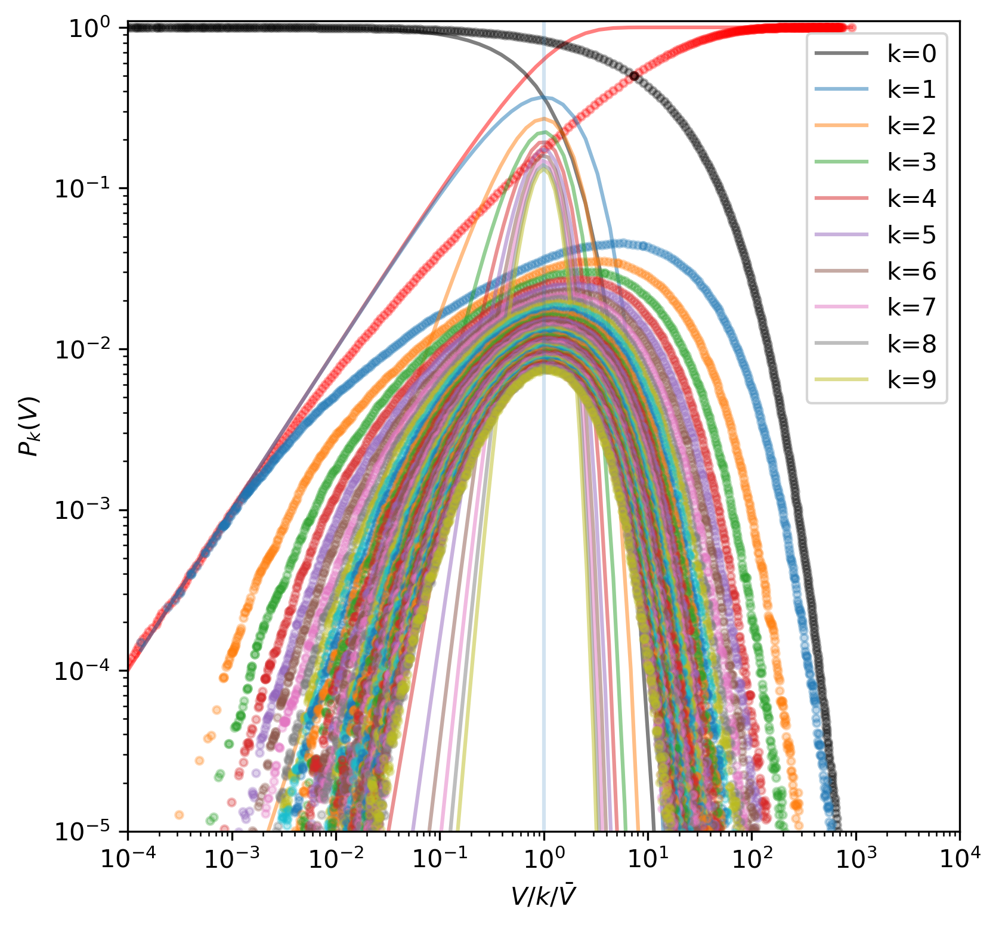

In [188]:
fig = plt.figure(figsize=(6,6),dpi=300)

for k in range(50):
    vol = CDFs[k+1].f.x
    ck = np.max([k,1])
    lab = ""
    color="black"
    if k==0:
        plt.plot(vol[::3]/Vbar,1-Erlang(0,1.e6,vol[::3])/ck,'-',label=lab,color="red",alpha=0.5)
        plt.semilogy(vol/Vbar, 1-Pks[0](vol),'.',alpha=.3,color="red") 

    if k > 0:
        ax = plt.gca()
        color = next(ax._get_lines.prop_cycler)['color']
    if (ck < 10) :
        lab = "k="+str(k)
        plt.plot(vol[::3]/Vbar,Erlang(k,1.e6,vol[::3])/ck,'-',label=lab,color=color,alpha=0.5)
    plt.semilogy(vol/ck/Vbar, Pks[k](vol),'.',alpha=.3,color=color) 
plt.axhline(np.exp(-2.5**3))
plt.xlim([1e-4,1e4])
plt.xscale("log")
plt.ylim([1e-5,11e-1])
plt.ylabel(r"$P_{k}(V)$" )
plt.xlabel(r"$V/k/\bar{V}$" )
plt.legend()
plt.axvline(1,alpha=.2);

*In the Figure above the thin solid lines are for a Poisson distribution, while the lines defined by dots are the measurements from the specific Levy flight defined above.*

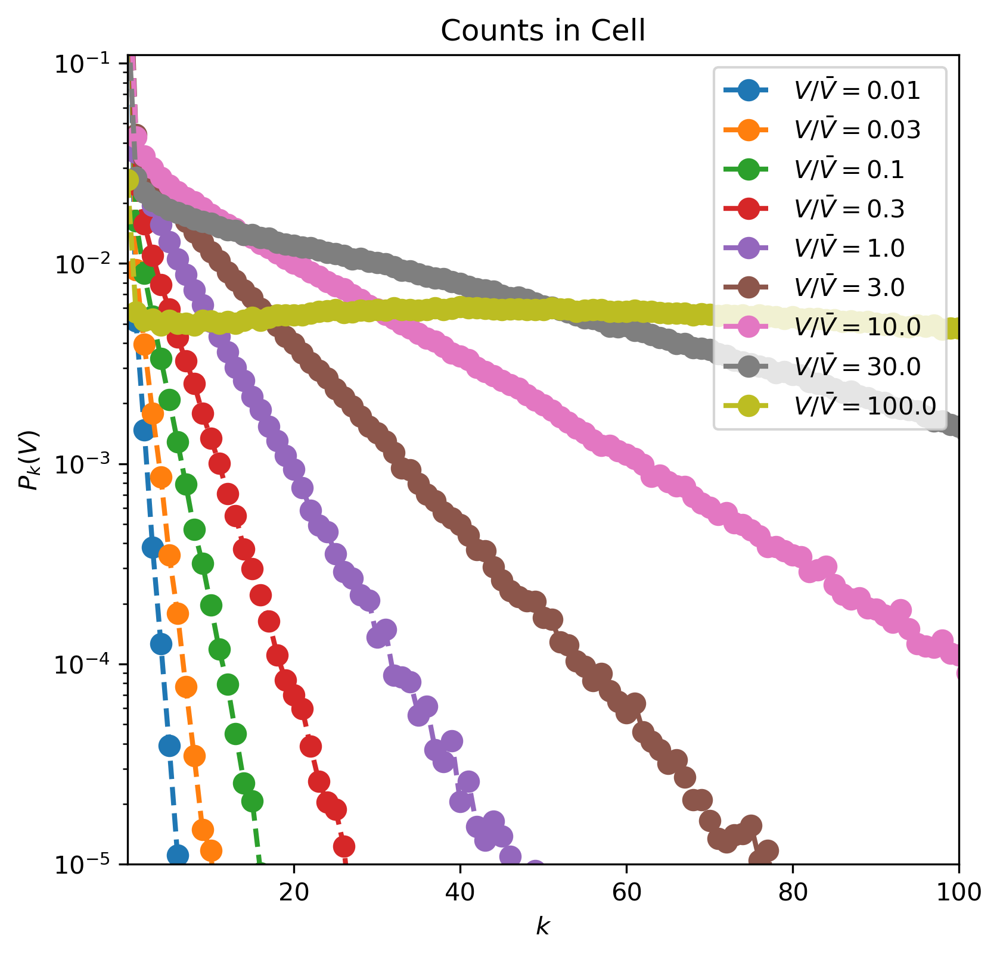

In [205]:
fig = plt.figure(figsize=(6,6),dpi=300)

for i, vol in enumerate(vols):
    plt.plot(kneighbors-1,CICs[i],'o--',lw=2,ms=8, label=r'${{V} / {\bar{V} }}=$'+str(vol/Vbar))

plt.title("Counts in Cell")
plt.xlim([1.e-4,100])
#plt.xscale("log")
plt.ylim([1e-5,11e-2])
plt.yscale("log")
plt.ylabel(r"$P_{k}(V)$" )
plt.xlabel(r"$k$" )
plt.legend(loc="upper right")
plt.axhline(Vbar,alpha=.2);

**Counts in cell.** *The distribution of counts in cell for different "smoothing" scales from one hundredth to one hundred times the mean volume.*

In [190]:
import scipy.stats as stats
nvols = np.logspace(-1,2,len(kneighbors))*Vbar
dCa = np.zeros((len(nvols),len(kneighbors)))
for i, vol in enumerate(nvols):
    dCa[i][:] = [Pks[k](vol) for k in kneighbors-1]

pC = [stats.rv_discrete(values=(kneighbors-1,np.round(dCa[i]/np.sum(dCa[i]), decimals=7)),\
    name='CountsInCell')  for i, vol in enumerate(nvols)]

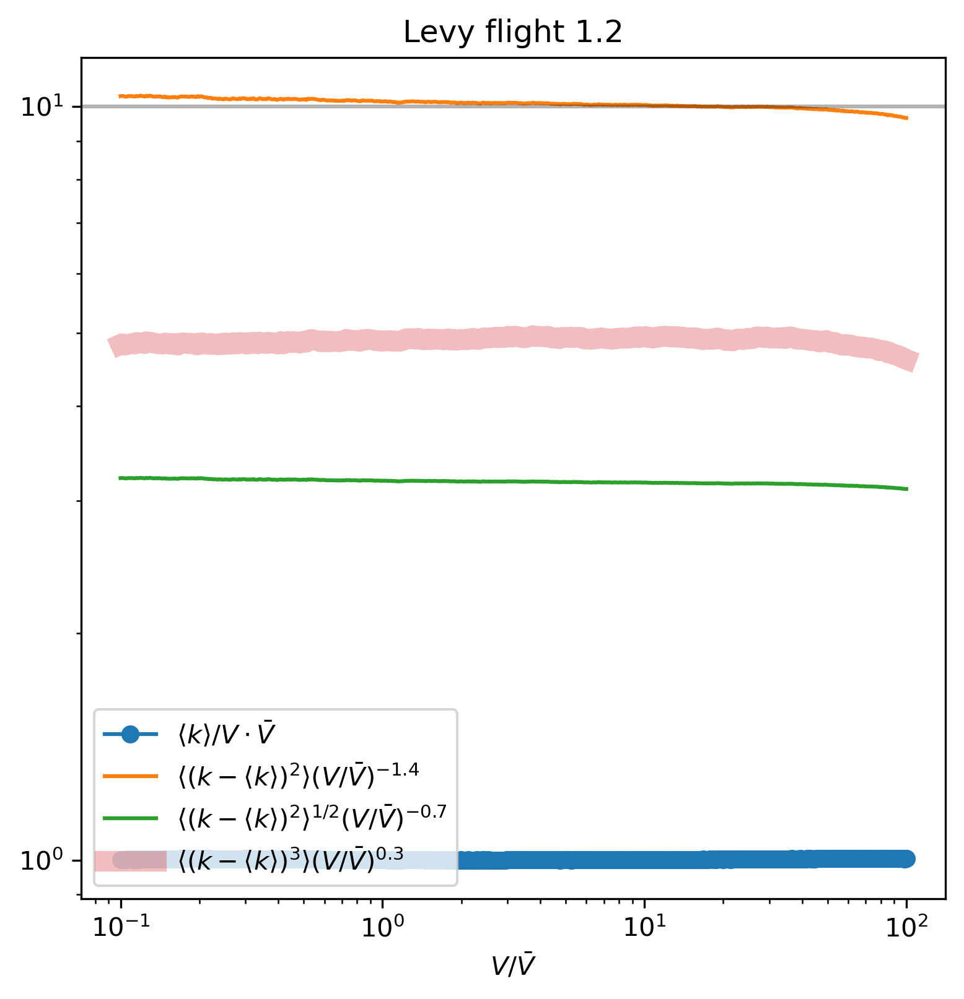

In [202]:
fig = plt.figure(figsize=(6,6),dpi=300)

pkstat = np.array([pC[i].stats(moments="mvsk") for i, vol in enumerate(nvols)])
pkstd = np.array([pC[i].std() for i, vol in enumerate(nvols)])

pnv = nvols/Vbar
plt.loglog(pnv, pkstat[:,0]/pnv,'o-',label=r"$\langle k \rangle/V \cdot \bar{V}$")
plt.plot(pnv, pkstat[:,1]/pnv**1.4, \
    label=r"$\langle (k - \langle k \rangle)^2 \rangle (V /\bar{V})^{-1.4}$")
plt.plot(pnv, pkstd * pnv**(-0.7), \
    label=r"$\langle (k - \langle k \rangle)^2 \rangle^{1/2} (V /\bar{V})^{-0.7}$")
plt.plot(pnv  , pkstat[:,2] * pnv**(0.3),alpha=.3,lw=8, \
    label=r"$\langle (k - \langle k \rangle)^3 \rangle (V /\bar{V})^{0.3}$")
#plt.plot(pnv  , pkstat[:,3]/pnv**(-1),alpha=.3,lw=4, \
#    label=r"$\langle (k - \langle k \rangle)^4 \rangle (V /\bar{V})^{-1}$")
plt.axhline(10,color="black",alpha=0.3)
plt.xlabel(r"$V/\bar{V}$")
plt.title("Levy flight "+str(b))
plt.legend();

*Above are the mean, variance, standard deviation and skewness as a function of scale.*